In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
folder_path = '../data'
datasets = [name for name in os.listdir(folder_path) if os.path.isdir(os.path.join(folder_path, name))]

In [3]:
def plot_feature_target(dataset):
    # Load feature and target data
    features_df = pd.read_csv(f'../data/{dataset}/features.csv')
    target_df = pd.read_csv(f'../data/{dataset}/targets.csv')

    # Filter out rows with non-numeric (NaN or infinite) target min and max values
    valid_idx = np.isfinite(target_df['min.log.penalty']) & np.isfinite(target_df['max.log.penalty'])
    target_min = target_df['min.log.penalty'][valid_idx]
    target_max = target_df['max.log.penalty'][valid_idx]
    features_df = features_df[valid_idx]

    # If there are more than 40 data points, randomly sample 40 points
    if len(features_df) > 40:
        sampled_idx = np.random.choice(features_df.index, 40, replace=False)
        features_df = features_df.loc[sampled_idx]
        target_min = target_min.loc[sampled_idx]
        target_max = target_max.loc[sampled_idx]

    # Rescale features to the range [1, 10]
    features_df = (features_df - features_df.min()) / (features_df.max() - features_df.min()) * 9 + 1

    # Apply log transformation to each feature
    features_df = np.log10(features_df)

    # Set maximum number of features per row
    max_features_per_row = 5
    num_features = features_df.shape[1]
    num_rows = (num_features + max_features_per_row - 1) // max_features_per_row  # Ceiling division

    # Create subplots with multiple rows and up to max_features_per_row columns
    fig, axes = plt.subplots(num_rows, min(num_features, max_features_per_row), figsize=(3 * min(num_features, max_features_per_row), 2 * num_rows), sharey=True)
    
    # Flatten axes in case of multiple rows for easier indexing
    axes = axes.flatten() if num_features > 1 else [axes]

    # Plot each feature column against target min and max
    for i, column in enumerate(features_df.columns):
        axes[i].scatter(features_df[column], target_min, edgecolors='black', facecolors='none', label='lower limit', s=20)  # Hollow points for target_min
        axes[i].scatter(features_df[column], target_max, color='black', label='upper limit', s=20)  # Solid points for target_max
        axes[i].set_title(f'{column} vs Target Interval', fontsize=10)
        axes[i].set_xlabel(column, fontsize=8)
        if i % max_features_per_row == 0:  # Set y-axis label only for the first feature in each row
            axes[i].set_ylabel('Target Interval', fontsize=8)
        axes[i].grid(True)
        axes[i].legend(fontsize=8)

    # Hide unused subplots if there are any
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    # Set the name of the dataset as the figure title
    fig.suptitle(f'Feature vs Target for {dataset}', fontsize=14)

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the suptitle
    plt.show()

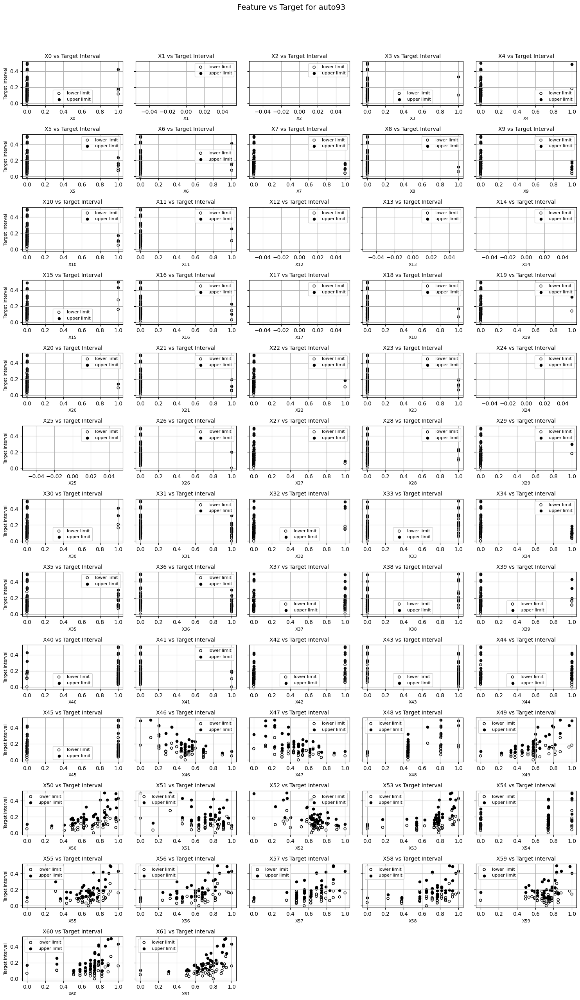

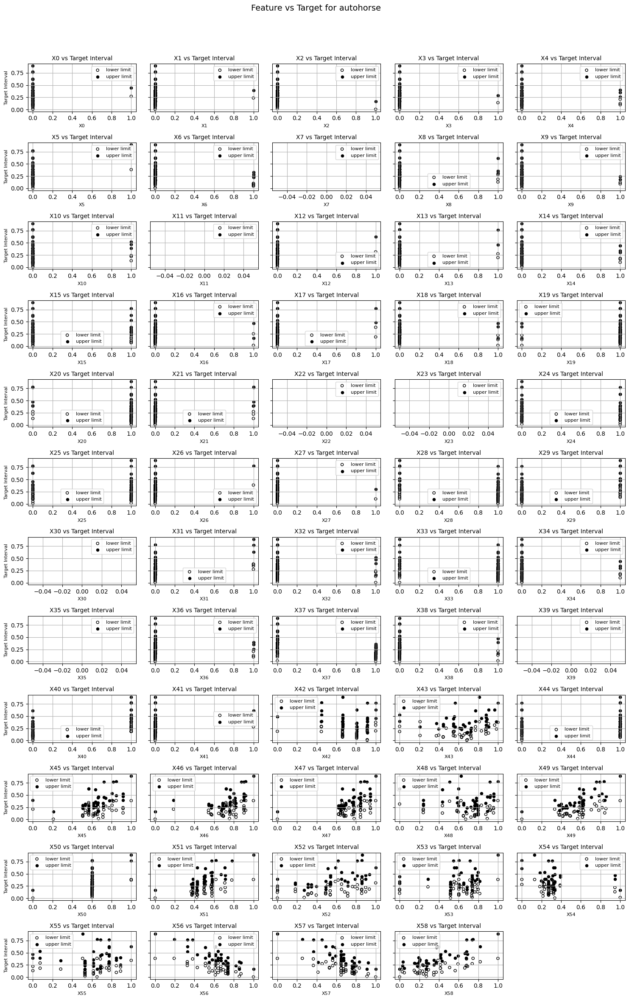

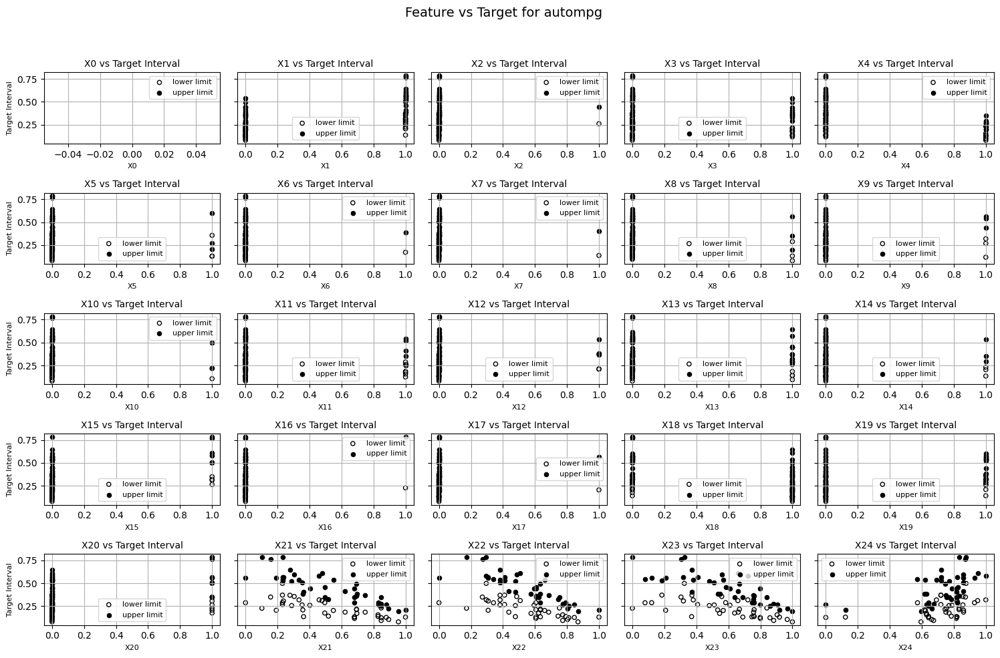

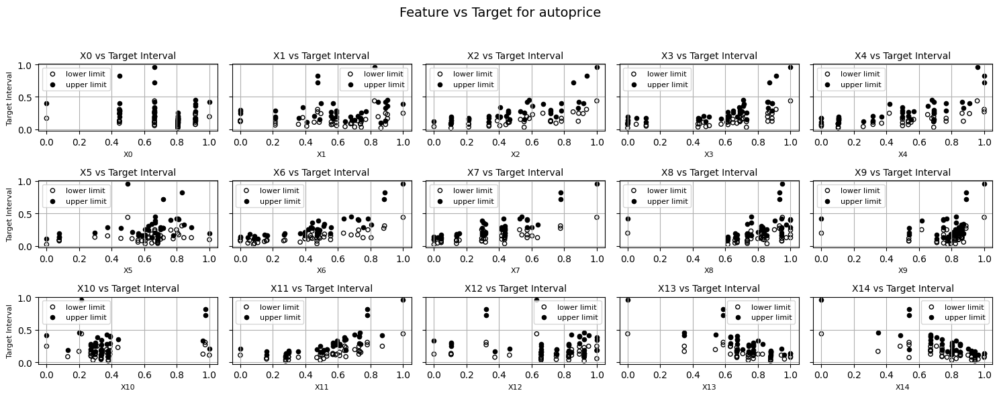

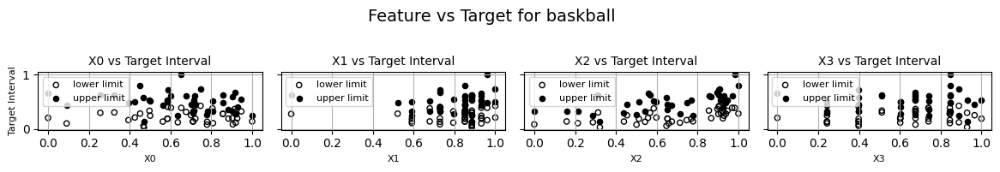

...

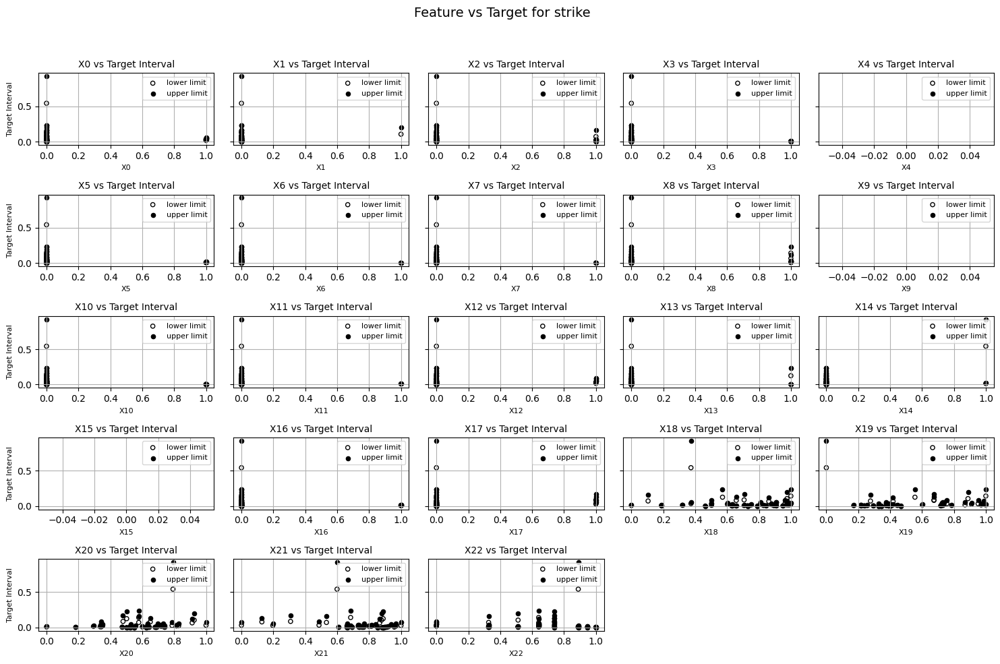

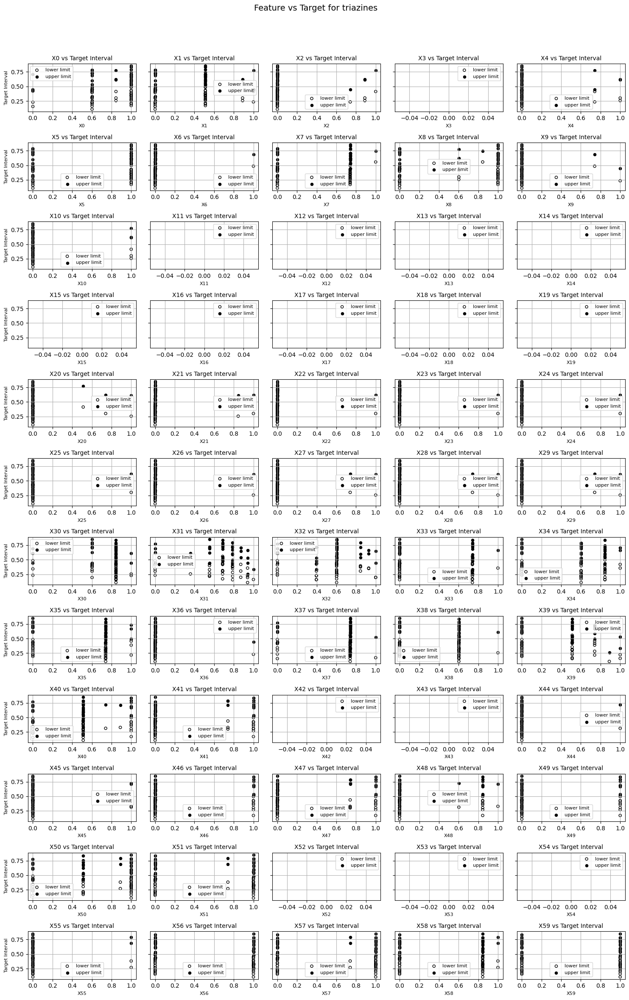

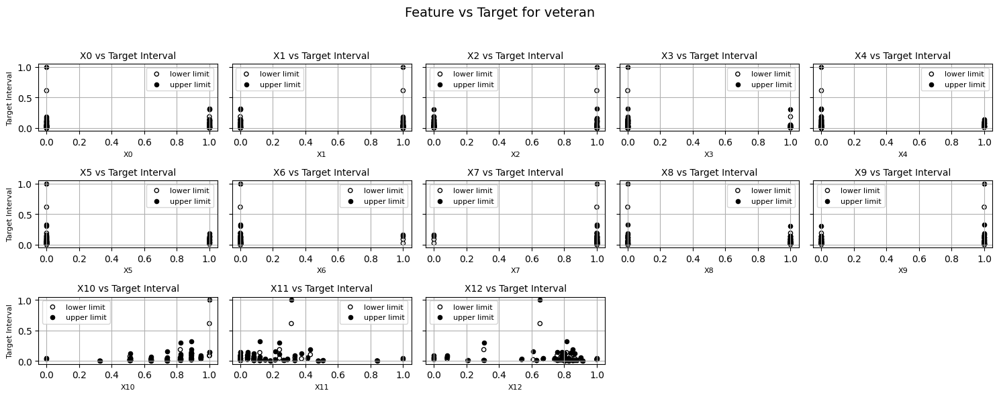

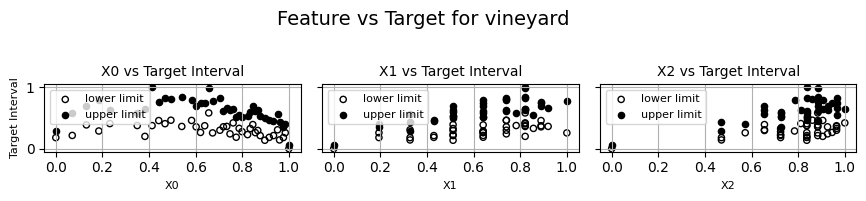

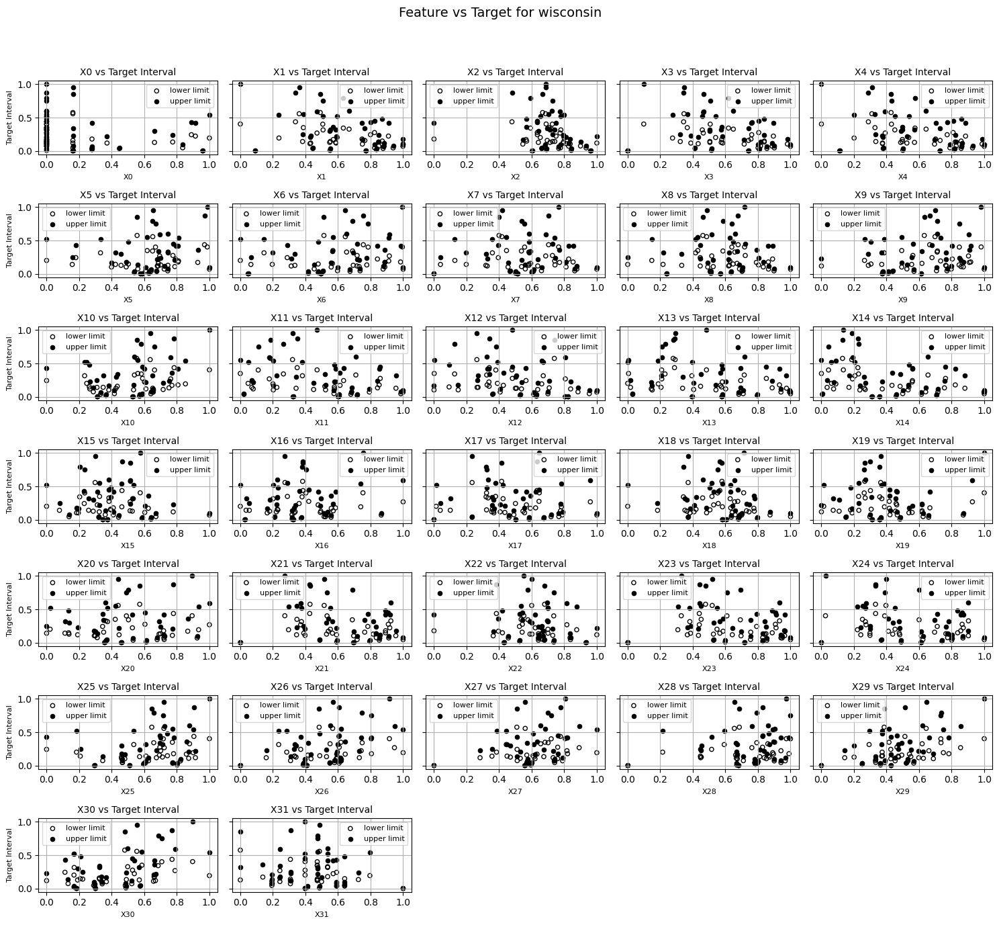

In [4]:
for dataset in datasets:
    plot_feature_target(dataset)